<a href="https://colab.research.google.com/github/niconielsen32/ObjectTracking/blob/main/ObjectTracking.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

El objetivo de este proyecto es realizar el seguimiento de personas en un video utilizando un filtro de Kalman y un modelo pre-entrenado de aprendizaje profundo. Este modelo procesa cada cuadro del video y devuelve una lista de 4 coordenadas que definen un cuadro delimitador alrededor de cada persona detectada en la imagen. Estas coordenadas corresponden a la posición de las esquinas del cuadro delimitador en píxeles, y se utilizan para localizar y seguir a cada persona a medida que se mueven a lo largo del video. 
El proceso de seguimiento requiere de asignar un ID único a cada persona detectada y registrar su posición en cada cuadro del video, lo que permite rastrear su movimiento y analizar su comportamiento a lo largo del tiempo.

# Requerimientos

## Paso 1: 
Obten el detector de objetos que vamos a utilizar. Puedes utilizar cualquier otro detector de objetos para obtener el cuadro delimitador y pasarlo al algoritmo de Solar que en realidad utiliza un filtro de Kalman para rastrear esos cuadros delimitadores en el entorno.

In [1]:
!pip install tf-centernet

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


## Opcional:
Si aún no conlas el repositorio base de este trabajo, usa:

In [2]:
!git clone https://github.com/niconielsen32/ObjectTracking.git

Cloning into 'ObjectTracking'...
remote: Enumerating objects: 43, done.
remote: Counting objects: 100% (43/43), done.
remote: Compressing objects: 100% (20/20), done.
remote: Total 43 (delta 1), reused 2 (delta 0), pack-reused 0
Unpacking objects: 100% (43/43), 10.84 MiB | 1.26 MiB/s, done.


In [3]:
!pip install filterpy==1.4.5 lap==0.4.0 ffmpeg-python seaborn Pillow numpy scikit-image

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.0/178.0 kB 3.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 87.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for filterpy: filename=filterpy-1.4.5-py3-none-any.whl size=110459 sha256=5d64704fa430fc0d130f56022fd8589edf6a98b8d03bf03405e064593547d6d7
  Stored in directory: /root/.cache/pip/wheels/0f/0c/ea/218f266af4ad626897562199fbbcba521b8497303200186102
  Created wheel for lap: filename=lap-0.4.0-cp310-cp310-linux_x86_64.whl size=1655217 sha256=f674a3c1253c6a43526b4b2c164c7edacca854ff38b03c77437524894614536f
  Stored in directory: /root/.cache/pip/wheels/00/42/2e/9dfe19270eea279d79e84767ff0d7b8082c3bf776cad00e83d
Successfully built filterpy lap


Si revisas el archivo `requirements.txt`, verás que necesitamos la biblioteca `filterpy`. Usaremos dicha biblioteca para implementar el filtro de Kalman y así dar seguimiento de los objetos detectados por el modelo de DL de un cuadro a otro.

El script `sort.py` se encarga de realizarel _trackeo_. Parte fundamental del proyecto será entender como se implementó el filtro.

# Object Tracking with SORT

In [4]:
import sys
import os
from google.colab import files
import centernet

sys.path.append("/content/ObjectTracking")
from sort import Sort
from lib import VisTrack, show_video, create_video

import numpy as np
import PIL.Image
import cv2
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
import shutil

## Upload the video you want to work with

In [5]:
!wget https://viratdata.org/video/VIRAT_S_010204_05_000856_000890.mp4 -O video.mp4
video_file = "video.mp4"
show_video(video_file)

--2023-05-15 01:06:59--  https://viratdata.org/video/VIRAT_S_010204_05_000856_000890.mp4
Resolving viratdata.org (viratdata.org)... 185.199.108.153, 185.199.109.153, 185.199.110.153, ...
Connecting to viratdata.org (viratdata.org)|185.199.108.153|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5248590 (5.0M) [application/mp4]
Saving to: ‘video.mp4’

video.mp4           100%[===================>]   5.00M  --.-KB/s    in 0.04s   

2023-05-15 01:07:00 (141 MB/s) - ‘video.mp4’ saved [5248590/5248590]



In [6]:
vt = VisTrack()

# Create an object detector

# Default: num_classes=80. This represents the number of classes we want to detect in ur image
obj = centernet.ObjectDetection(num_classes=80)

# num_classes=80 and weights_path=None: Pre-trained COCO model will be loaded. (i.e its weights)
obj.load_weights(weights_path=None)

766861424/766861424 [==============================] - 24s 0us/step


## Example image

Before we use our object detector, we test it with an image

--2023-05-15 01:07:42--  https://images.squarespace-cdn.com/content/v1/57aa455937c581cbe1aba790/1478015230831-I9TWP5BJX54APXMNPJ7W/ke17ZwdGBToddI8pDm48kBZw6jF4_OvU-ddo_vwqGhp7gQa3H78H3Y0txjaiv_0fDoOvxcdMmMKkDsyUqMSsMWxHk725yiiHCCLfrh8O1z5QPOohDIaIeljMHgDF5CVlOqpeNLcJ80NK65_fV7S1Ub61YCrK70I7JIpWiI8ho4Yi1WvVNQtDE81xuRbL1MFKm0sD-Bab7E9MY8W31A7zMQ/image-asset.jpeg
Resolving images.squarespace-cdn.com (images.squarespace-cdn.com)... 23.202.33.202, 23.202.33.105
Connecting to images.squarespace-cdn.com (images.squarespace-cdn.com)|23.202.33.202|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 371299 (363K) [image/jpeg]
Saving to: ‘img.jpeg’

img.jpeg            100%[===================>] 362.60K  --.-KB/s    in 0.004s  

2023-05-15 01:07:42 (91.0 MB/s) - ‘img.jpeg’ saved [371299/371299]



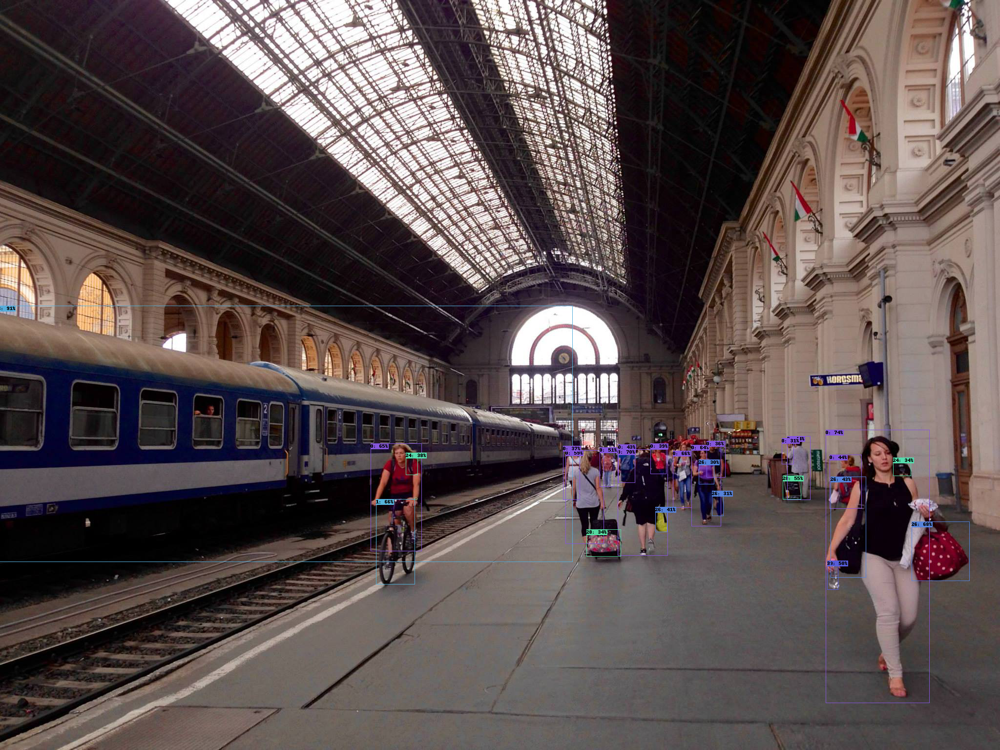

In [7]:
!wget https://images.squarespace-cdn.com/content/v1/57aa455937c581cbe1aba790/1478015230831-I9TWP5BJX54APXMNPJ7W/ke17ZwdGBToddI8pDm48kBZw6jF4_OvU-ddo_vwqGhp7gQa3H78H3Y0txjaiv_0fDoOvxcdMmMKkDsyUqMSsMWxHk725yiiHCCLfrh8O1z5QPOohDIaIeljMHgDF5CVlOqpeNLcJ80NK65_fV7S1Ub61YCrK70I7JIpWiI8ho4Yi1WvVNQtDE81xuRbL1MFKm0sD-Bab7E9MY8W31A7zMQ/image-asset.jpeg -O img.jpeg 

# get an image
p_img = PIL.Image.open('img.jpeg')
img = cv2.cvtColor(np.array(p_img), cv2.COLOR_BGR2RGB)

boxes, classes, scores = obj.predict(img)

vt.draw_bounding_boxes(p_img, boxes, classes, scores)

## Predict on the video

In [8]:
# use opencv and pass our video
vidcap = cv2.VideoCapture(video_file)

# get all individual frames or images of our video
fps = vidcap.get(cv2.CAP_PROP_FPS)

#get the length of the video
length = int(vidcap.get(cv2.CAP_PROP_FRAME_COUNT))

# output folder to save the output video with all the objects tracked in its box
folder_out = "Track"
if os.path.exists(folder_out):
    shutil.rmtree(folder_out)
os.makedirs(folder_out)

draw_imgs = []
# if the probability of detect and object is <0.3, then do not detect it
sort = Sort(max_age=1, min_hits=3, iou_threshold=0.3)

# progress bar
pbar = tqdm(total=length)
i = 0
# a while loop running though all the frames that we have in our actually video
while True:
    #read indivudual frames from the video and save in thr frame variable:
    ret, frame = vidcap.read()
    if not ret:
# finish until we are not getting any frames
        break

# pass every frame to our model and for it, get the bounding boxes, classes and scores(probabilities)
    boxes, classes, scores = obj.predict(frame)
# get the length of our bounding boxes, i.e the number of detections in our frame
    detections_in_frame = len(boxes)
    if detections_in_frame:
        # get only the indexes for person detection
        # centernet will do detection on all the COCO classes. "person" is class number 0 
        idxs = np.where(classes == 0)[0]
        boxes = boxes[idxs]
        scores = scores[idxs]
        classes = classes[idxs]
    else:
        boxes = np.empty((0, 5))

# make an horizontal stack of boxes and scores, i.e the results of all the detections of all the frames
    dets = np.hstack((boxes, scores[:,np.newaxis]))
    # use kalman filter to update the detections
    # what does update? : Updates the state vector with observed bounding box(bbox).
    res = sort.update(dets)

    # from the results we can get the boxes that we tracked
    boxes_track = res[:,:-1]
    # and also the ids
    boces_ids = res[:,-1].astype(int)

    # create a video using all those images that pass though
    p_frame = PIL.Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    # if we have detections, draw bounding boxes
    if detections_in_frame:
        p_frame = vt.draw_bounding_boxes(p_frame, boxes_track, boces_ids, scores)
    p_frame.save(os.path.join(folder_out, f"{i:03d}.png"))

    i+=1
    pbar.update(1)

  0%|          | 0/584 [00:00<?, ?it/s]

## Show and download the tracking

In [9]:
track_video_file = 'tracking.mp4'
create_video(frames_patten='Track/%03d.png', video_file = track_video_file, framerate=fps)

In [10]:
#files.download(track_video_file)

In [11]:
show_video(track_video_file)